In [142]:
import cv2
import os

import numpy as np
import matplotlib.pyplot as plt

from itertools import product

import pandas as pd

### read files

In [114]:
def read(patient):
    images = {
        "h&e": [],
        "melan": [],
        "sox": []
    }

    # Iterate over all files in the patient directory
    for file_name in os.listdir(patient):
        file_path = os.path.join(patient, file_name)

        # Check if it's a file
        if os.path.isfile(file_path):
            # Read the image
            image = cv2.imread(file_path)

            # Check if the image was successfully read
            if image is not None:
                # Determine the type based on filename
                if "h&e" in file_name.lower():
                    images["h&e"].append((image, file_name))
                elif "mela" in file_name.lower():
                    images["melan"].append((image, file_name))
                elif "sox" in file_name.lower():
                    images["sox"].append((image, file_name))

    return images

### compute similarity

In [115]:
def extract_main_contour(image):
    # convert image to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    # apply Gaussian Blur to reduce noise
    blurred = cv2.GaussianBlur(gray, (5, 5), 0)

    # adaptive threshold to handle variations in color intensity
    adaptive_thresh = cv2.adaptiveThreshold(blurred, 255,
                                            cv2.ADAPTIVE_THRESH_GAUSSIAN_C, 
                                            cv2.THRESH_BINARY_INV, 11, 2)
    
    # apply morphological operations to clean up image
    kernel = np.ones((15, 15), np.uint8)
    morph = cv2.morphologyEx(adaptive_thresh, cv2.MORPH_CLOSE, kernel)
    
    # find contours
    contours, _ = cv2.findContours(morph, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    
    # return the largest contour
    return max(contours, key = cv2.contourArea)


# compute shape similarity between two contours
def shape_similarity(contour1, contour2):
    # matchShapes returns distance between shapes, take the inverse for similarity
    return 1/cv2.matchShapes(contour1, contour2, cv2.CONTOURS_MATCH_I1, 0.0)


In [116]:
def similarity_matrix_3(set1, set2, set3):
    # Initialize a 3D matrix to hold all similarity scores and averages
    matrix = np.zeros((len(set1), len(set2), len(set3)), dtype=object)

    for i, img1 in enumerate(set1):
        img1_contour = extract_main_contour(img1)
        for j, img2 in enumerate(set2):
            img2_contour = extract_main_contour(img2)
            for k, img3 in enumerate(set3):
                img3_contour = extract_main_contour(img3)

                # Calculate similarity scores between the images
                sim12 = shape_similarity(img1_contour, img2_contour)
                sim13 = shape_similarity(img1_contour, img3_contour)
                sim23 = shape_similarity(img2_contour, img3_contour)

                # Calculate the average similarity score
                avg_similarity = (sim12 + sim13 + sim23) / 3
                
                # Store the average similarity along with individual scores
                matrix[i, j, k] = (avg_similarity, sim12, sim13, sim23)

    return matrix

def find_best_combination_3(matrix, set1_filenames, set2_filenames, set3_filenames):
    # Find the index of the maximum average similarity score
    best_index = np.unravel_index(np.argmax(matrix[:, :, 0]), matrix.shape)  # Only consider average scores
    set1_index, set2_index, set3_index = best_index

    avg_score, sim12, sim13, sim23 = matrix[set1_index, set2_index, set3_index]

    return {
        'set1_image': set1_filenames[set1_index],
        'set2_image': set2_filenames[set2_index],
        'set3_image': set3_filenames[set3_index],
        'best_score': avg_score,
        'sim12': sim12,
        'sim13': sim13,
        'sim23': sim23
    }

def pipeline(images, names):
    # Extract the sets of images and filenames
    set1 = images[names[0]]
    set2 = images[names[1]]
    set3 = images[names[2]]

    # Unpack the tuples into separate lists of images and filenames
    set1_images, set1_filenames = zip(*set1)
    set2_images, set2_filenames = zip(*set2)
    set3_images, set3_filenames = zip(*set3)

    # Calculate the 3D similarity matrix
    sim_matrix = similarity_matrix_3(set1_images, set2_images, set3_images)

    # Find the best combination
    best_combination = find_best_combination_3(sim_matrix, set1_filenames, set2_filenames, set3_filenames)

    # Display the best combination of images
    fig, ax = plt.subplots(1, 3, figsize=(15, 5))

    # Get the images corresponding to the best combination
    img1 = set1_images[set1_filenames.index(best_combination['set1_image'])]
    img2 = set2_images[set2_filenames.index(best_combination['set2_image'])]
    img3 = set3_images[set3_filenames.index(best_combination['set3_image'])]

    # Display the images
    ax[0].imshow(img1)
    ax[1].imshow(img2)
    ax[2].imshow(img3)

    # Set titles with the provided filenames
    ax[0].set_title(f"{best_combination['set1_image']}")
    ax[1].set_title(f"{best_combination['set2_image']}")
    ax[2].set_title(f"{best_combination['set3_image']}")

    # Hide axes
    ax[0].axis('off')
    ax[1].axis('off')
    ax[2].axis('off')

    plt.show()

    return best_combination

### process files

In [117]:
def natural_sort_key(s):
    """Generate a sorting key that handles numerical order."""
    import re
    return [int(text) if text.isdigit() else text.lower() for text in re.split('([0-9]+)', s)]

def get_folder_names(directory):
    folder_names = [name for name in os.listdir(directory) if os.path.isdir(os.path.join(directory, name))]
    return sorted(folder_names, key=natural_sort_key)

In [161]:
def process(folder_lst):
    intersections = []  # List to store folder names with no intersections

    for folder in folder_lst:
        images = read("images/" + folder)

        # Check for required keys
        if not all(key in images for key in ['h&e', 'sox', 'melan']):
            print(f"Skipping folder '{folder}' due to missing keys.")
            continue

        intersection = pipeline(images, ['h&e', 'sox', 'melan'])
        print(folder + ' score: ' + str(intersection['best_score']))
        # print(intersection)
        intersections.append(intersection)
    
    return intersections

### test

In [166]:
folders = get_folder_names("images")

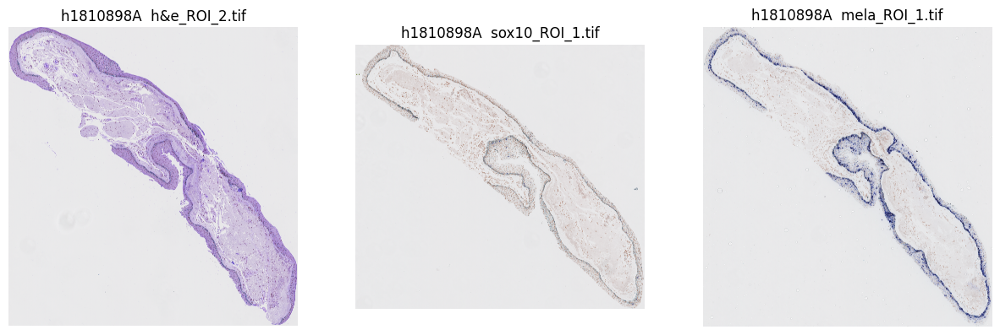

h1810898A score: 10.717386497805535


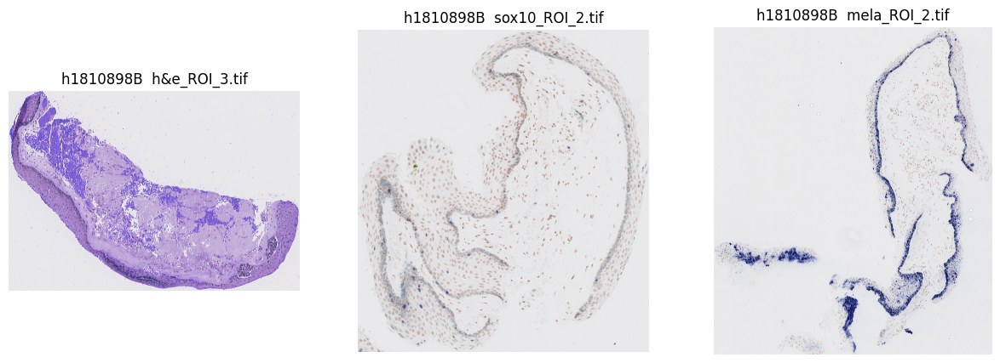

h1810898B score: 1.2198692899594084


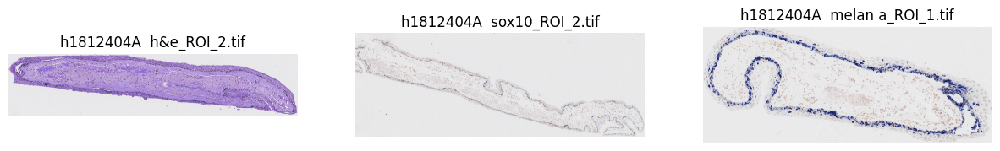

h1812404A score: 0.09604251392564069


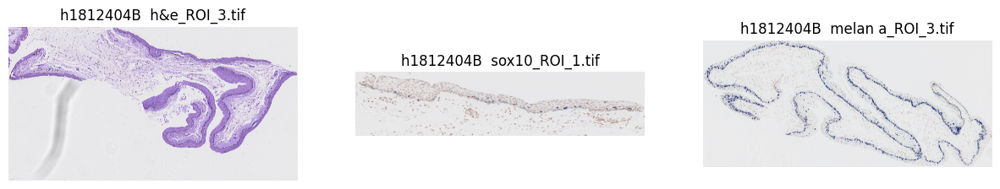

h1812404B score: 0.6787523633301215


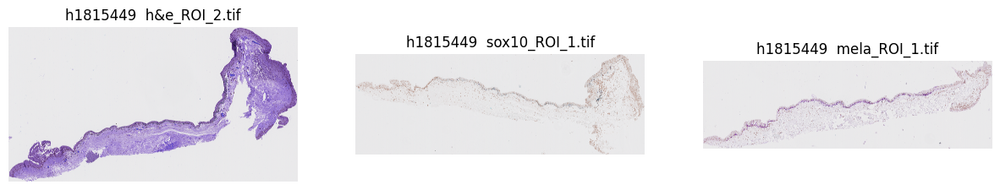

h1815449 score: 0.08061226113254065


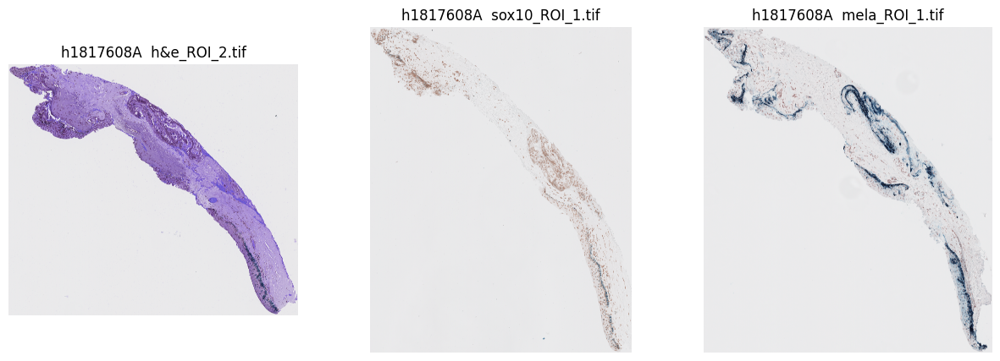

h1817608A score: 0.5345601042181616


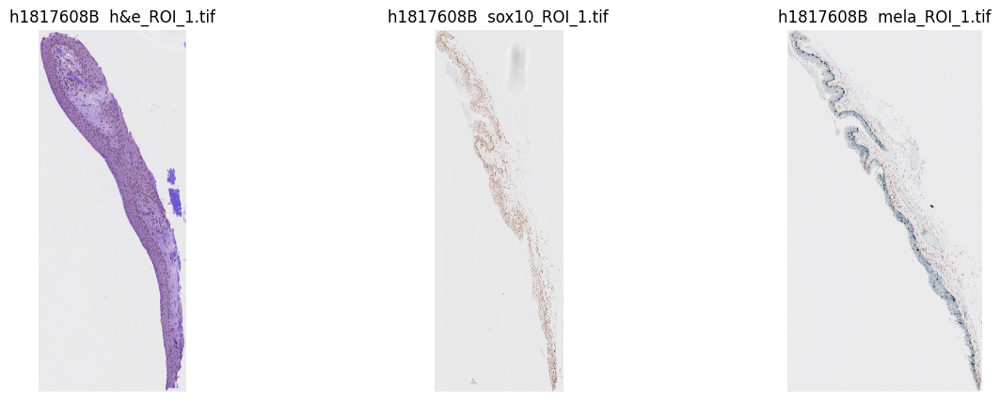

h1817608B score: 0.12353097108991536


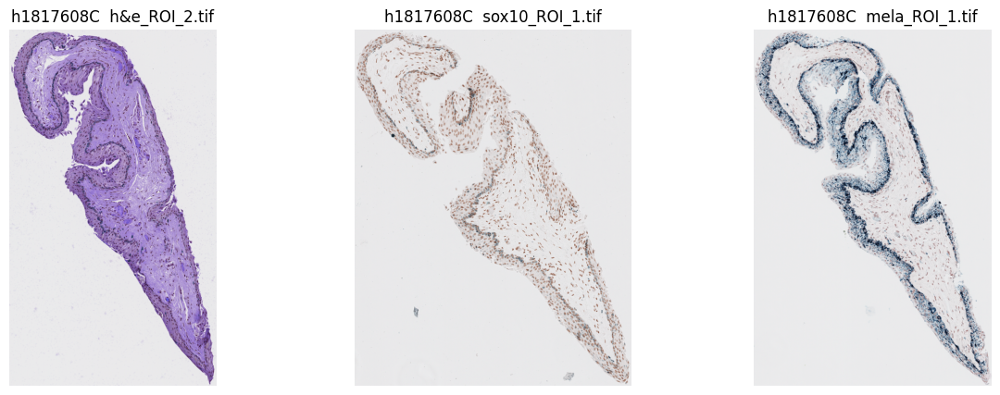

h1817608C score: 6.400145802048872


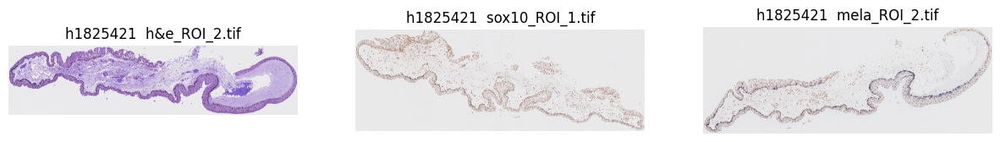

h1825421 score: 1.495408637065368


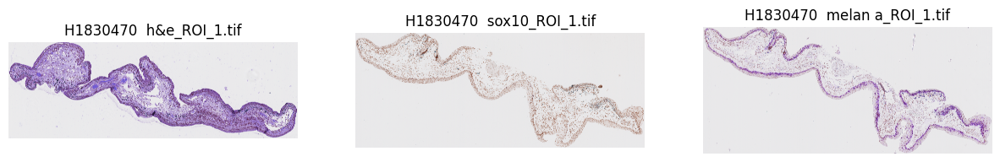

h1830470 score: 2.2593938064408476


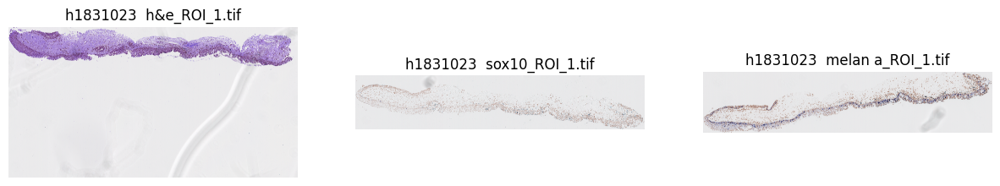

h1831023 score: 0.038159069979246785


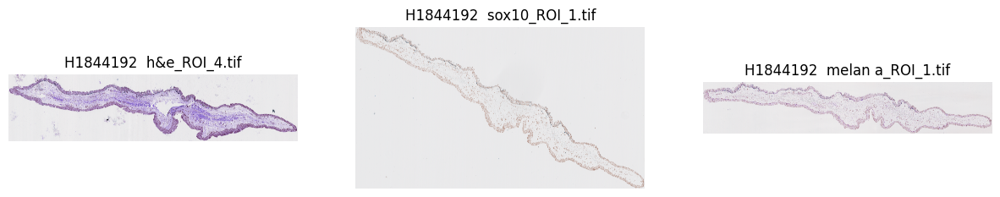

h1844192 score: 0.08630434560734851


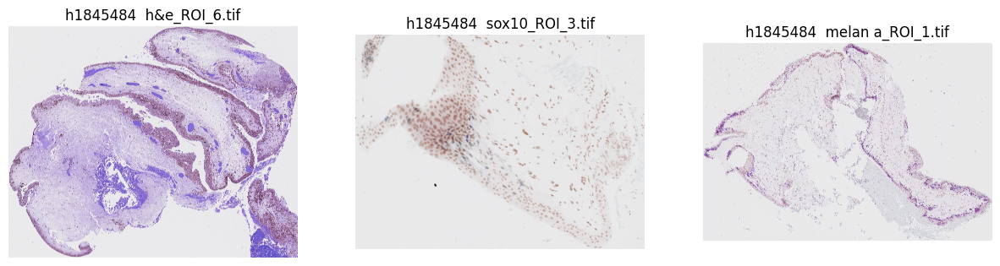

h1845484 score: 3.9448518506152386


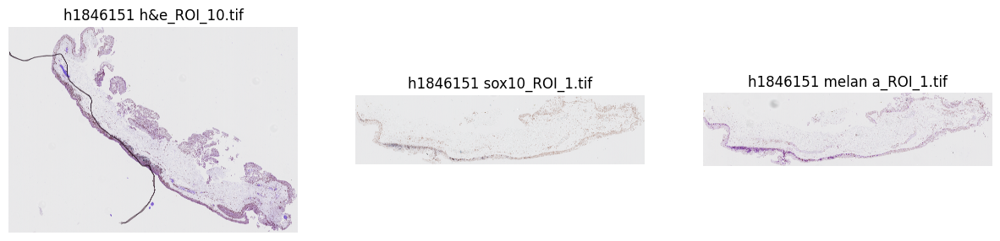

h1846151 score: 2.1121889199349773


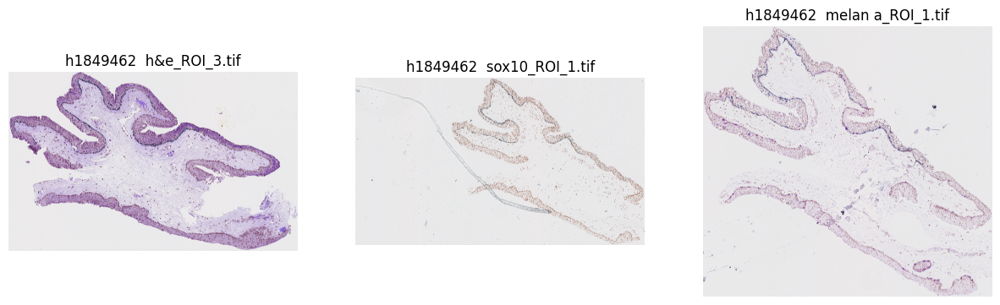

h1849462 score: 5.182640835927915


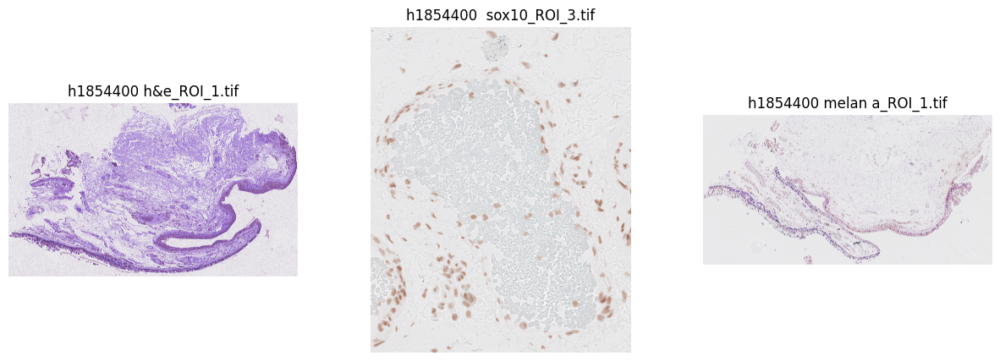

h1854400 score: 3.8448355099396827


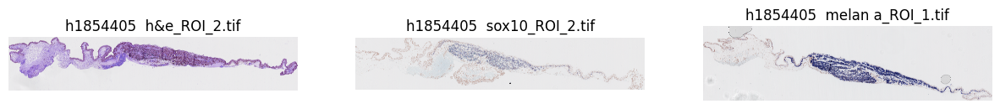

h1854405 score: 0.06540168415692078


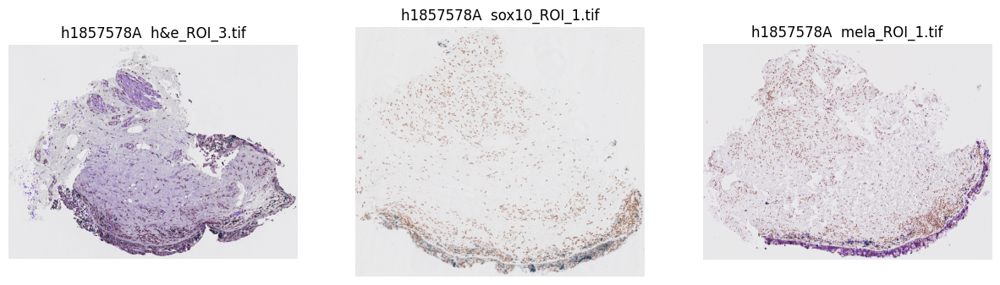

h1857578A score: 19.12166371230109


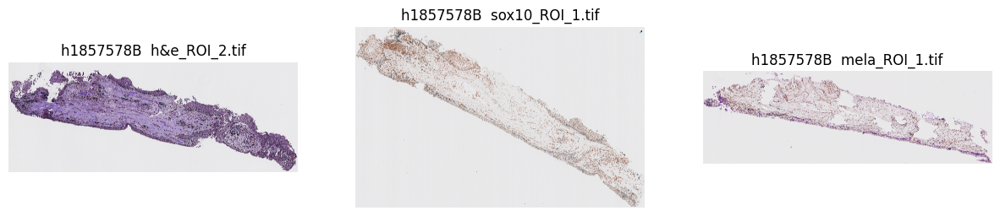

h1857578B score: 2.422058994381222


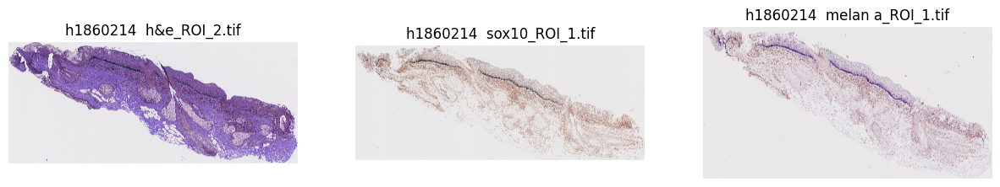

h1860214 score: 5.667936361891038


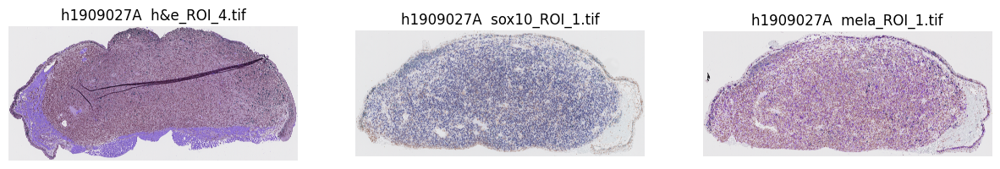

h1909027A score: 123.43427971721235


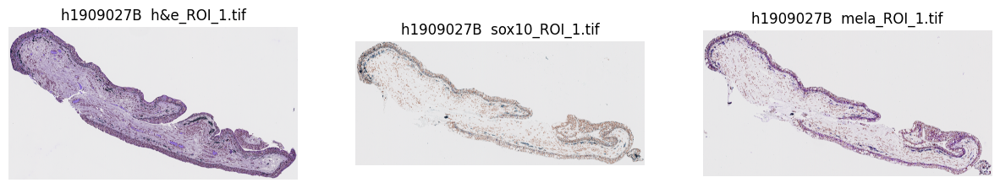

h1909027B score: 6.253319042509253


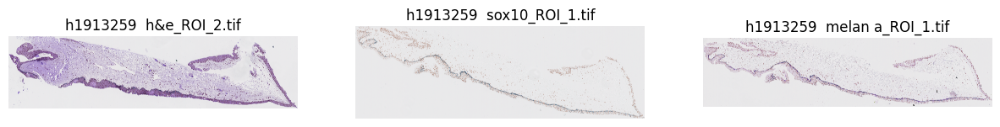

h1913259 score: 1.1630614015338017


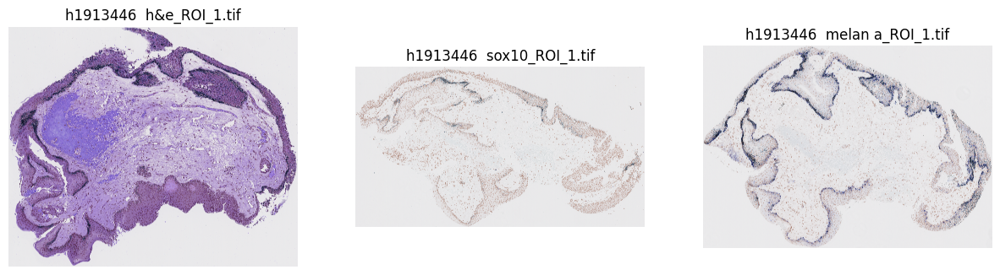

h1913446 score: 6.292652392513035


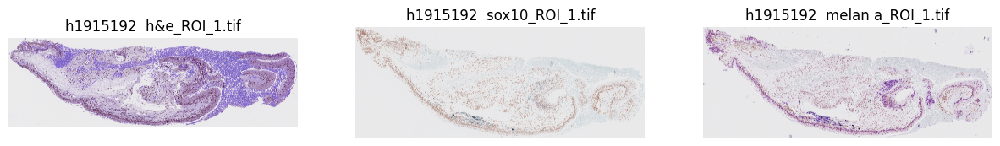

h1915192 score: 22.030639097900035


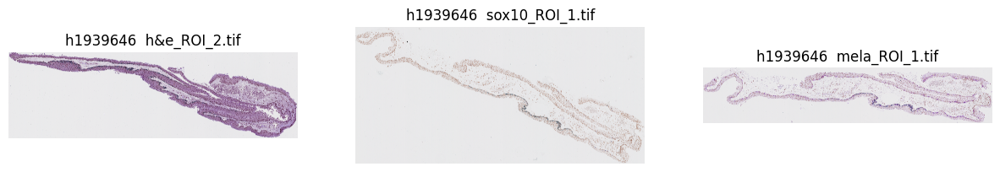

h1939646 score: 0.9729802596263083


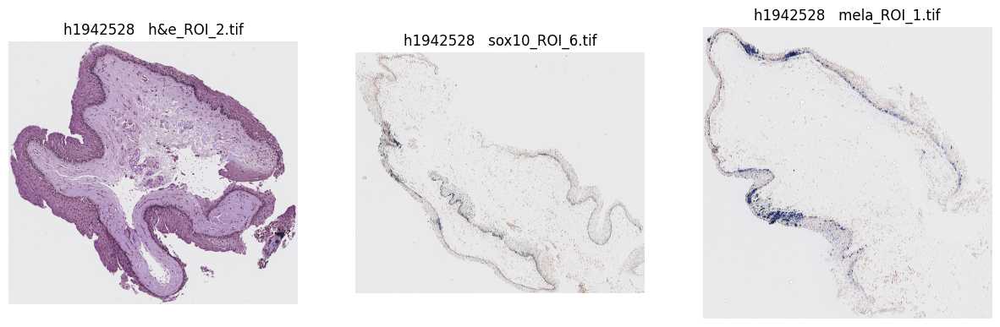

h1942528 score: 1.4740429678504616


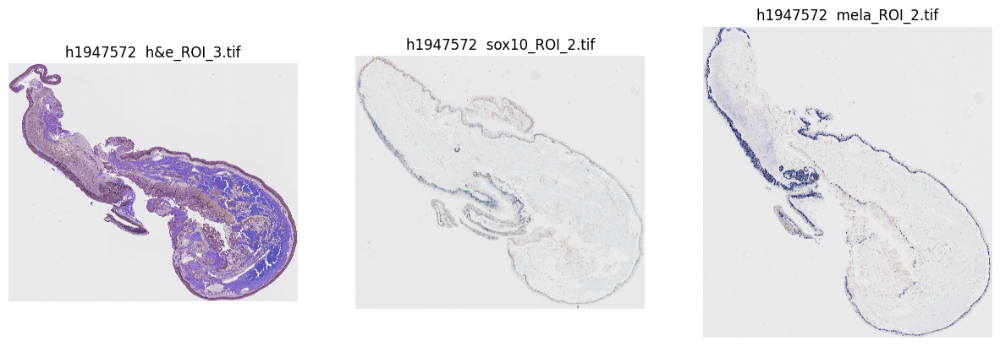

h1947572 score: 1.6147273812169545


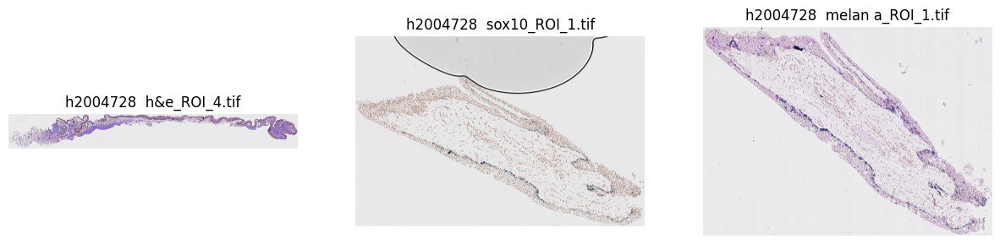

h2004728 score: 1.7292395411338448


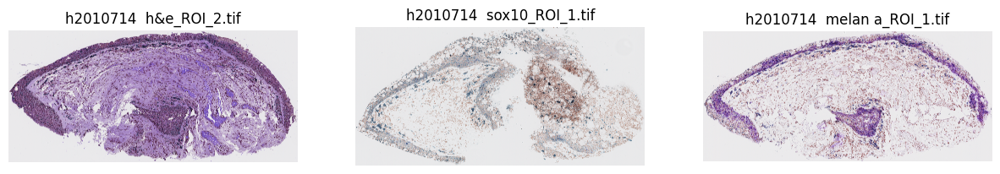

h2010714 score: 27.886624490783827


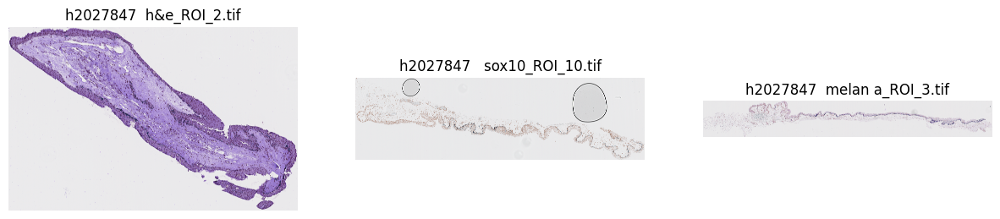

h2027847 score: 0.06308236536720872


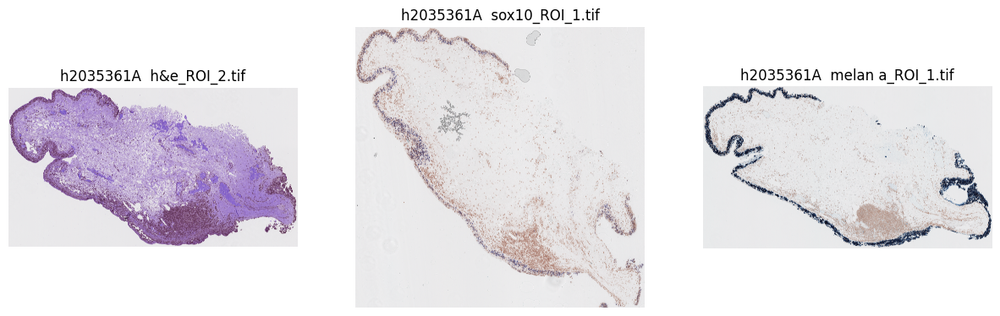

h2035361A score: 64.65176857675563


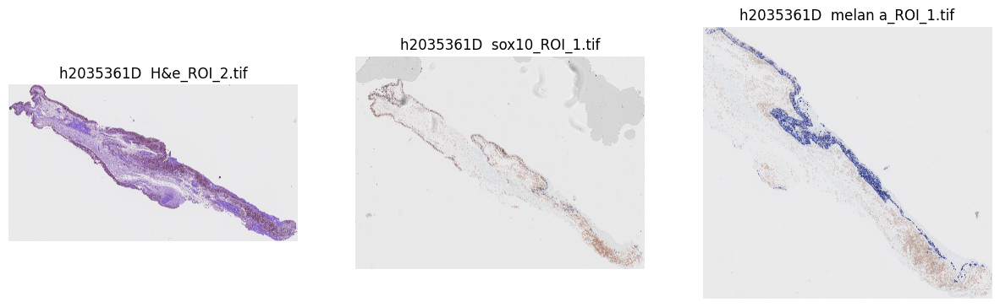

h2035361D score: 0.23722236531757554


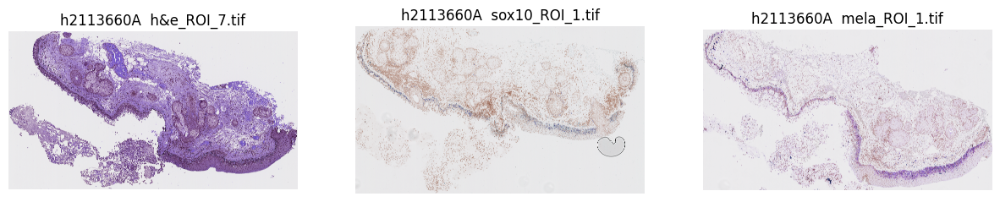

h2113660A score: 6.364654481099695


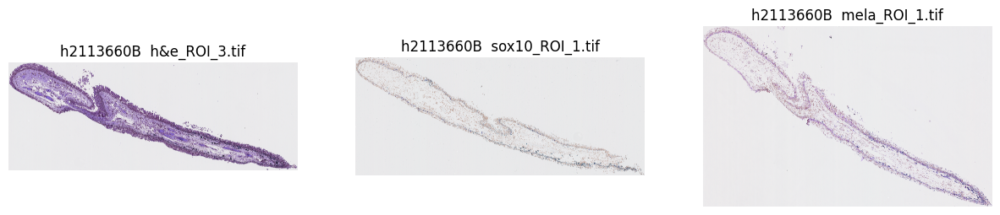

h21136608B score: 0.16868692720020428


In [167]:
matches = process(folders)

In [168]:
df = pd.DataFrame(matches)
df['patient'] = df['set1_image'].str[:9]
df = df[['patient'] + [col for col in df.columns if col != 'patient']]
df.to_csv('output.csv', index=False)
